# Gaussian Mixture Model over Deep Autoencoders
## Inteligencia Computacional 2021-2, Grupo 8a
Nicolás Canales, Matías Vergara

Este notebook tiene por objetivo aplicar el Modelo de Mezcla de Gaussianas (GMM) sobre las codificaciones 2D de las curvas de luz obtenidas mediante Autoencoders y posteriormente visualizar los clusters resultantes. 


Recordemos que los objetos con los que estamos trabajando son aquellos de tipo periódico, clasificados por ALeRCE como: "LPV", "Periodic-Other", "RRL", "CEP", "E" o "DSCT". 


### Referencias:
https://scikit-learn.org/stable/modules/mixture.html

J. Amat, Detección de anomalías con Gaussian Mixture Model (GMM) y Python. Diciembre 2020. www.cienciadedatos.net

B. Zong et al. “Deep Autoencoding Gaussian Mixture Model for Unsupervised Anomaly Detection”. ICLR 2018 


## Librerías necesarias

In [ ]:
!pip install mat4py

In [ ]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
from mat4py import loadmat

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
#style.use('ggplot') or plt.style.use('ggplot')

%matplotlib inline
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10, Spectral6
output_notebook()

# Preprocesado y modelado
# ==============================================================================
from sklearn.mixture import GaussianMixture
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, QuantileTransformer

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

## Traer las codificaciones

In [ ]:
# mejores experimentos de https://drive.google.com/drive/u/1/folders/1cx_gys-_Lzx8bMsiCNR2B2itQLI3yx2w 
# (por inspección visual, se escogen aquellos en que las clases logran ser minimamente separadas).
!gdown --id 10a3EP_FBhg9R8B_mwMrT1kQdygueI48o #experimento 1  AUTOENCODER
!gdown --id 1YRhpyvTuw3a6UCO7-SgogvAH8rdoUJUV #experimento 13 AUTOENCODER
!gdown --id 1NI1I6zS65h6S_Rxd_AaN2PGNOLSiwq9U #experimento 18 AUTOENCODER 
!gdown --id 11AtmyM9qqimh3jXGB9EU7D8DzWyjIbzL #experimento 21 AUTOENCODER
!gdown --id 1ws1mHAa3K0djqyoMyuvFtKnAzbHTWEg3 #experimento 22 AUTOENCODER
!gdown --id 1NC-jQq4Ptx5eWP5AWueYZ9Ss4ri7UoKi #experimento 23 AUTOENCODER
!gdown --id 1qZqzUupmpYP3NToL9RJOOmVLzT9P14qR #experimento 24 AUTOENCODER 
!gdown --id 1nuGg0P1d9UQEyxbgdQ9Jv01QUyYUPQpl #experimento 32 AUTOENCODER
!gdown --id 11Rxy1gtCWKsLC3_kn-ZgL1bMxcVbpWGo #experimento UMAP 


Downloading...
From: https://drive.google.com/uc?id=10a3EP_FBhg9R8B_mwMrT1kQdygueI48o
To: /content/exp1.csv
100% 2.97M/2.97M [00:00<00:00, 94.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1YRhpyvTuw3a6UCO7-SgogvAH8rdoUJUV
To: /content/exp13.csv
100% 2.95M/2.95M [00:00<00:00, 88.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1NI1I6zS65h6S_Rxd_AaN2PGNOLSiwq9U
To: /content/exp18.csv
100% 2.94M/2.94M [00:00<00:00, 94.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=11AtmyM9qqimh3jXGB9EU7D8DzWyjIbzL
To: /content/exp21.csv
100% 2.94M/2.94M [00:00<00:00, 94.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ws1mHAa3K0djqyoMyuvFtKnAzbHTWEg3
To: /content/exp22.csv
100% 2.94M/2.94M [00:00<00:00, 91.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1NC-jQq4Ptx5eWP5AWueYZ9Ss4ri7UoKi
To: /content/exp23.csv
100% 2.94M/2.94M [00:00<00:00, 92.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1qZqzUupmpYP3NToL9RJOOmVLzT9P14qR
To: /content/ex

# Escogiendo la data a utilizar

In [ ]:
exp1 = pd.read_csv("exp1.csv", index_col=0)
exp13 = pd.read_csv("exp13.csv", index_col=0)
exp18 = pd.read_csv("exp18.csv", index_col=0)
exp21 = pd.read_csv("exp21.csv", index_col=0)
exp22 = pd.read_csv("exp22.csv", index_col=0)
exp23 = pd.read_csv("exp23.csv", index_col=0)
exp24 = pd.read_csv("exp24.csv", index_col=0)
exp32 = pd.read_csv("exp32.csv", index_col=0)
expUMAP = pd.read_csv("QT_SELECTED_50NN.csv").drop(labels=["Unnamed: 0"], axis=1)
# MODIFICAR PARA ESCOGER EL EXPERIMENTO CON EL QUE SE TRABAJA.
exp = exp32 

In [ ]:
exp32

,x,y,target
oid,,,
ZTF17aadmidf,0.471349,0.381177,E
ZTF17aadqpnu,0.385071,0.748508,RRL
ZTF18aapkwuy,0.159595,0.381781,RRL
ZTF18aajoeri,0.340033,0.759110,RRL
ZTF18adaiqlm,0.345498,0.762255,E
...,...,...,...
sinteticPeriodicOther12555,0.528526,0.312108,Periodic-Other
sinteticPeriodicOther12556,0.551932,0.332941,Periodic-Other
sinteticPeriodicOther12557,0.515555,0.299465,Periodic-Other


In [ ]:
X = exp
X['oid'] = X.index
X.head()

,x,y,target,oid
oid,,,,
ZTF17aadmidf,0.471349,0.381177,E,ZTF17aadmidf
ZTF17aadqpnu,0.385071,0.748508,RRL,ZTF17aadqpnu
ZTF18aapkwuy,0.159595,0.381781,RRL,ZTF18aapkwuy
ZTF18aajoeri,0.340033,0.759110,RRL,ZTF18aajoeri
ZTF18adaiqlm,0.345498,0.762255,E,ZTF18adaiqlm


Visualicemos los datos que trajimos:

In [ ]:
import plotly.express as px
df = X
fig = px.scatter(df, x='x', y='y',
              title="Embedding de curvas de luz, colores según clase ALeRCE",
              color='target', opacity=0.3, hover_name="oid")
fig.show()

# Entrenando un GMM

**¿Cómo saber el número de componentes y tipo de matriz de covarianza?**

Al tratarse de un problema no supervisado, no hay forma de conocer de antemano el número de componentes y tipo de matriz de covarianza óptimos. Afortunadamente, al ser un modelo probabilístico, se puede recurrir a métricas como el Akaike information criterion (AIC) o Bayesian information criterion (BIC) para identificar cómo de bien se ajustan los datos observados al modelo creado, a la vez que se controla el exceso de overfitting. En la implementación de Scikit Learn, para ambas métricas, cuanto más bajo el valor, mejor.

In [ ]:
# Para el tunning, necesitamos deshacernos de las columnas no numericas
X = X.drop(labels=["target", "oid"], axis=1)

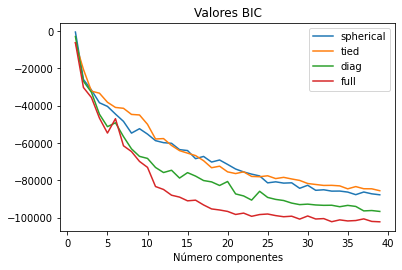

In [ ]:
# Tunning del modelo GMM
# ==============================================================================
fig, ax = plt.subplots(figsize=(6, 3.84))

# Probaremos con 1 a 40 componentes
n_components = range(1, 40)
covariance_types = ['spherical', 'tied', 'diag', 'full']

for covariance_type in covariance_types:
    valores_bic = []
    
    for i in n_components:
        modelo = GaussianMixture(n_components=i, covariance_type=covariance_type)
        modelo = modelo.fit(X)
        valores_bic.append(modelo.bic(X))
        
    ax.plot(n_components, valores_bic, label=covariance_type)
        
ax.set_title("Valores BIC")
ax.set_xlabel("Número componentes")
ax.legend();

Viendo la métrica BIC, su valor se estabiliza a partir de las 30 componentes. También notamos que la mejor covarianza en este caso es full.

In [ ]:
# Entrenamiento del modelo GMM
# ==================================================================
modelo_gmm = GaussianMixture(
              n_components = 6,
              covariance_type = 'full',
              random_state = 123,
)

modelo_gmm.fit(X=X)

GaussianMixture(n_components=6, random_state=123)

## Predicción
Los modelos `GaussianMixture` tienen varios métodos de predicción. Para utilizarlos como detectores de anomalía, interesa conocer la densidad de probabilidad que tiene cada observación acorde al modelo. Este valor puede obtenerse con el método `score_samples()`. En la documentación se indica que este método devuelve el logaritmo de la probabilidad, pero, estrictamente hablando, se trata del logaritmo de la densidad de probabilidad. Es por esta razón por la que, si se revierte el logaritmo con la función exponente, se obtienen valores mayores de 1.

In [ ]:
# Predicción log probabilidad
# ===================================================
log_probabilidad_predicha = modelo_gmm.score_samples(X)
log_probabilidad_predicha

array([0.23408764, 0.54203042, 0.32774642, ..., 0.11898614, 0.13920949,
       0.15180174])

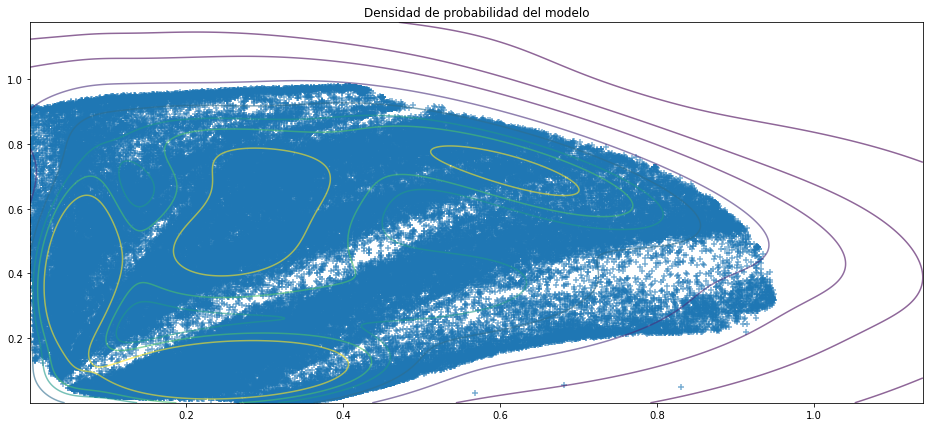

In [ ]:
# Mapa de densidad de probabilidad
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 7))
 
# Grid de valores dentro del rango observado
x = np.linspace(min(X.x)*0.8, max(X.x)*1.2, 1000)
y = np.linspace(min(X.y)*0.8, max(X.y)*1.2, 1000)
xx, yy = np.meshgrid(x, y)

# Densidad de probabilidad de cada valor del grid
scores = modelo_gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
scores = np.exp(scores) # Los valores están en log

ax.scatter(X.x, X.y, alpha=0.6, marker="+")
ax.contour(
    xx, yy, scores.reshape(xx.shape), alpha=0.6,
    levels=np.percentile(scores, np.linspace(0, 100, 10))[1:-1]
)
ax.set_title('Densidad de probabilidad del modelo');

Una vez calculada la densidad de probabilidad de cada observación acorde al modelo, se pueden emplear como criterio para identificar anomalías. Cabría esperar que observaciones con una probabilidad predicha muy baja, sean anómalas.

In [ ]:
df_resultados = X.copy()
df_resultados['log_proba'] = log_probabilidad_predicha
df_resultados = df_resultados.sort_values(by='log_proba')
top_anomalias = df_resultados.head(1000)
top_anomalias

,x,y,log_proba
oid,,,
ZTF18ablqklf,0.830829,0.050914,-4.224998
ZTF18aayhxfk,0.681884,0.055461,-2.908927
ZTF18abefwcu,0.913701,0.219221,-2.858604
ZTF18aaayvhl,0.915136,0.243075,-2.663784
ZTF18abtpsoe,0.926507,0.263510,-2.628931
...,...,...,...
sinteticDSCTS137,0.850790,0.301475,-1.602328
ZTF18abomvcl,0.002544,0.653166,-1.601970
ZTF18abbxkab,0.003227,0.739696,-1.601594


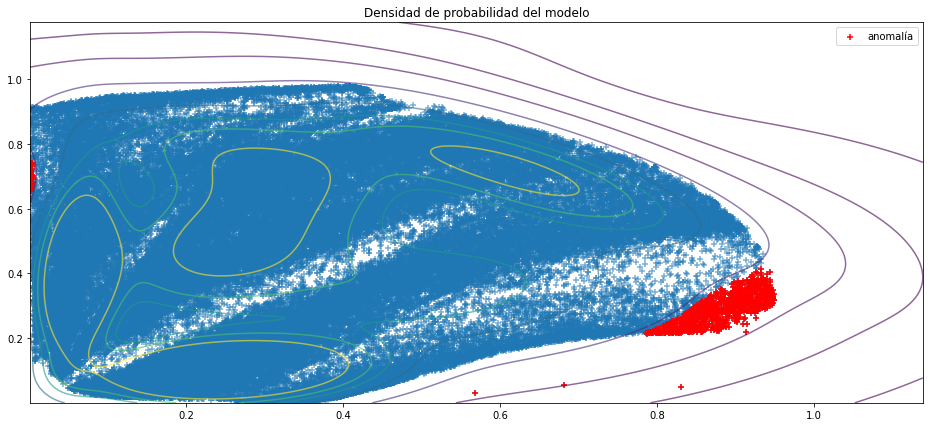

In [ ]:
# Mapa de densidad de probabilidad
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 7))

# Grid de valores dentro del rango observado
x = np.linspace(min(X.x)*0.8, max(X.x)*1.2, 1000)
y = np.linspace(min(X.y)*0.8, max(X.y)*1.2, 1000)
xx, yy = np.meshgrid(x, y)

# Densidad de probabilidad de cada valor del grid
scores = modelo_gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
scores = np.exp(scores) # Los valores están en log

ax.scatter(X.x, X.y, alpha=0.6, marker="+")
ax.scatter(top_anomalias.x, top_anomalias.y, c="red", label='anomalía', marker="+")
ax.contour(
    xx, yy, scores.reshape(xx.shape),
    alpha=0.6, cmap='viridis',
    levels=np.percentile(scores, np.linspace(0, 100, 10))[1:-1]
)
ax.set_title('Densidad de probabilidad del modelo');
ax.legend();

In [ ]:
#X = df_resultados.tail(df_resultados.shape[0] -1000)
#X.drop(labels=["log_proba"], axis=1, inplace=True)

In [ ]:
prob_puntos = modelo_gmm.predict_proba(X)

In [ ]:
clusters = {}
for i in range(0, len(prob_puntos)):
  max_prob = max(prob_puntos[i])
  max_comp = prob_puntos[i].tolist().index(max_prob)
  clusters[X.index[i]]=max_comp

In [ ]:
clusters_df = pd.DataFrame.from_dict(clusters, orient='index', columns=['Componente principal'])
clusters_df.to_csv("clusters.csv")

In [ ]:
clusters_df

,Componente principal
ZTF17aadmidf,0
ZTF17aadqpnu,4
ZTF18aapkwuy,2
ZTF18aajoeri,4
ZTF18adaiqlm,4
...,...
sinteticPeriodicOther12555,0
sinteticPeriodicOther12556,0
sinteticPeriodicOther12557,0
sinteticPeriodicOther12558,0


In [ ]:
import plotly.express as px
df = exp
df = pd.concat([df, clusters_df], axis=1)
#df.dropna(inplace=True) # removimos las filas que quedan con componente NaN por ser anomalias en clusters_df
df

,x,y,target,oid,Componente principal
oid,,,,,
ZTF17aadmidf,0.471349,0.381177,E,ZTF17aadmidf,0
ZTF17aadqpnu,0.385071,0.748508,RRL,ZTF17aadqpnu,4
ZTF18aapkwuy,0.159595,0.381781,RRL,ZTF18aapkwuy,2
ZTF18aajoeri,0.340033,0.759110,RRL,ZTF18aajoeri,4
ZTF18adaiqlm,0.345498,0.762255,E,ZTF18adaiqlm,4
...,...,...,...,...,...
sinteticPeriodicOther12555,0.528526,0.312108,Periodic-Other,sinteticPeriodicOther12555,0
sinteticPeriodicOther12556,0.551932,0.332941,Periodic-Other,sinteticPeriodicOther12556,0
sinteticPeriodicOther12557,0.515555,0.299465,Periodic-Other,sinteticPeriodicOther12557,0


In [ ]:
df["Componente principal"] = df["Componente principal"].astype(str)
fig = px.scatter(df, x='x', y='y', hover_name="oid", hover_data=["target"],
              color='Componente principal', opacity=0.3,
              title="Embedding de curvas de luz, color según cluster de mayor probabilidad predicha",
              labels={
                     "x": "x",
                     "y": "y",
                     "Componente principal": "Cluster"
                 })
fig.show()

In [ ]:
df.to_csv("Clusters_6.csv")